In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
from math import atan2, hypot # angle and dist
import os
%matplotlib inline
import glob
import time
from sklearn.svm import LinearSVC, SVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split

# 1. Training SVC Classifier

## 1.1 Load Images

In [2]:
def AppendImageInFolder(l, path):
    images_files = glob.glob(path + '/*.png')
    for image in images_files:
        l.append(image)    

cars = []
notcars = []
debug = []
for fn in ['GTI_Far', 'GTI_Left', 'GTI_MiddleClose', 'GTI_Right', 'KITTI_extracted']:
    AppendImageInFolder(cars, 'training_data/vehicles/'+fn)
for fn in ['Extras', 'GTI']:
    AppendImageInFolder(notcars, 'training_data/non-vehicles/'+fn)
AppendImageInFolder(debug, 'debug')
print(len(cars), len(notcars), len(debug))    

8792 8968 124


## 1.2 Image feature extraction

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)


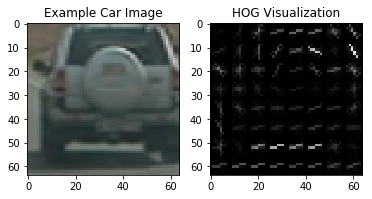

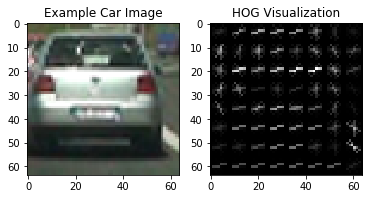

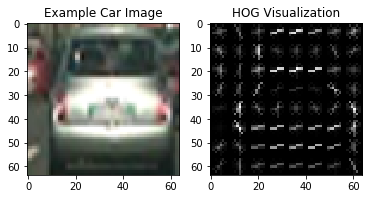

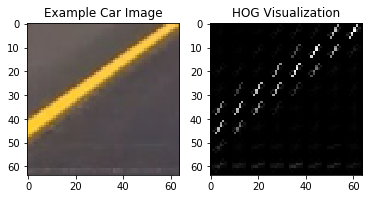

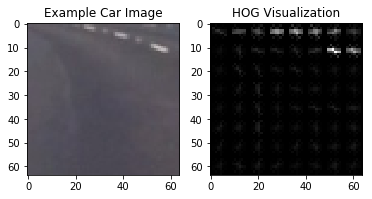

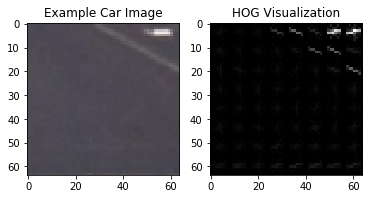

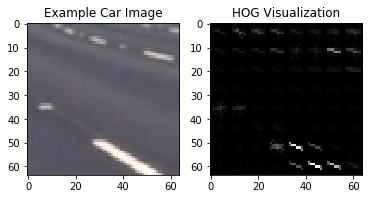

In [3]:
from lessonFunctions import *

# Define a function to return HOG features and visualization   

def DisplayHOG(fn, gray=True):
    image = mpimg.imread(fn)
    # Define HOG parameters
    orient = 9
    pix_per_cell = 8
    cell_per_block = 1
    channel = 1
    
    if gray:
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,channel]
    # Call our function with vis=True to see an image output
    features, hog_image = get_hog_features(feature_image, orient, 
                            pix_per_cell, cell_per_block, 
                            vis=True, feature_vec=False)
    print(features.shape)

    # Plot the examples
    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title('Example Car Image')
    plt.subplot(122)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG Visualization')

# Read in the image
DisplayHOG('training_data/vehicles/GTI_MiddleClose/image0075.png')
DisplayHOG('training_data/vehicles/GTI_MiddleClose/image0105.png')
DisplayHOG('training_data/vehicles/GTI_MiddleClose/image0197.png')
DisplayHOG('training_data/non-vehicles/Extras/extra215.png')
DisplayHOG('training_data/non-vehicles/Extras/extra1061.png')
DisplayHOG('training_data/non-vehicles/Extras/extra1538.png')
DisplayHOG('training_data/non-vehicles/Extras/extra1525.png')


In [7]:
color_space = 'HLS' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 1
hog_channel = 'GRAY' # Can be 0, 1, 2, or "ALL"
hist_bins = 16
spatial_size=(8, 8)
spatial_feat = True
hist_feat = True
hog_feat = True


t=time.time()
car_features = extract_features(cars, color_space=color_space, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_size=spatial_size, hist_bins = hist_bins,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_size=spatial_size, hist_bins = hist_bins,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
print(car_features.shape)
print(notcar_features.shape)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


26.08 Seconds to extract HOG features...
(8792, 816)
(8968, 816)


## 1.3 Data Preparation for training

In [8]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations 8 pixels per cell and 1 cells per block
Feature vector length: 816


## 1.4 Classifier with SVC

In [10]:
# Use a linear SVC 
#svc = LinearSVC(C=1e5)
svc = SVC(C=1e10, gamma=6e-4)
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

19.22 Seconds to train SVC...
Test Accuracy of SVC =  0.9935


# 2. Sliding Window and Classificaition

In [11]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    off_windows = []
    #2) Iterate over all windows in the list
    cnt=1
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))   
        #mpimg.imsave('debug/patch_'+str(cnt).strip()+'.png', test_img, format='png')
        cnt+=1
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
        else:
            off_windows.append(window)
    #8) Return windows for positive detections
    return on_windows, off_windows

In [12]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                 xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0] * (1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1] * (1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0] * (xy_overlap[0]))
    ny_buffer = np.int(xy_window[1] * (xy_overlap[1]))
    nx_windows = np.int((xspan - nx_buffer) / nx_pix_per_step)
    ny_windows = np.int((yspan - ny_buffer) / ny_pix_per_step)    
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs * nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys * ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]

            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [13]:
def DetectCar(fn, horizon_y=500):
    image = mpimg.imread(fn)

    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255

    windows32 = slide_window(image, x_start_stop=[400, 800], y_start_stop=[horizon_y, horizon_y+40], 
                        xy_window=(32, 32), xy_overlap=(0.5, 0.9))
    windows64 = slide_window(image, x_start_stop=[200, 1000], y_start_stop=[horizon_y, horizon_y+80], 
                        xy_window=(64, 50), xy_overlap=(0.5, 0.9))
    windows96 = slide_window(image, x_start_stop=[200, 1000], y_start_stop=[horizon_y, horizon_y+120], 
                        xy_window=(100, 65), xy_overlap=(0.5, 0.8))
    windows128 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, horizon_y+140], 
                        xy_window=(128, 86), xy_overlap=(0.5, 0.7))
    windows160 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, 550], 
                        xy_window=(160, 100), xy_overlap=(0.5, 0.6))
    windows196 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, 600], 
                        xy_window=(196, 100), xy_overlap=(0.5, 0.5))
    windows256 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, 660], 
                        xy_window=(320, 240), xy_overlap=(0.5, 0.5))

    windows = windows32+windows64+windows96+windows128+windows160+windows196+windows256

    hot_windows, off_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=2)  
    
    plt.figure(figsize=(18,12))
    plt.imshow(window_img)
    return hot_windows

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


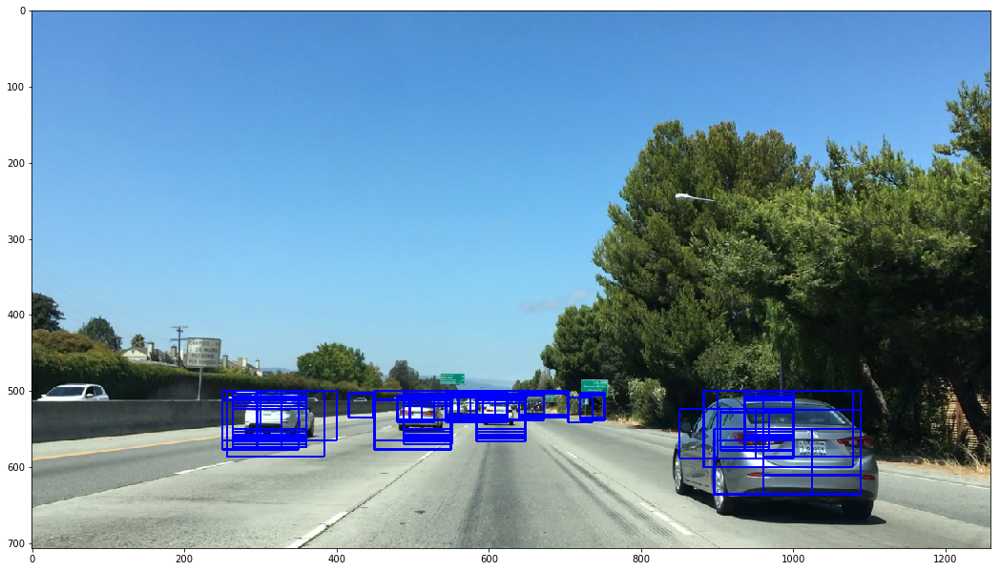

In [14]:
hw=DetectCar('test_images/bbox-example-image.jpg')

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


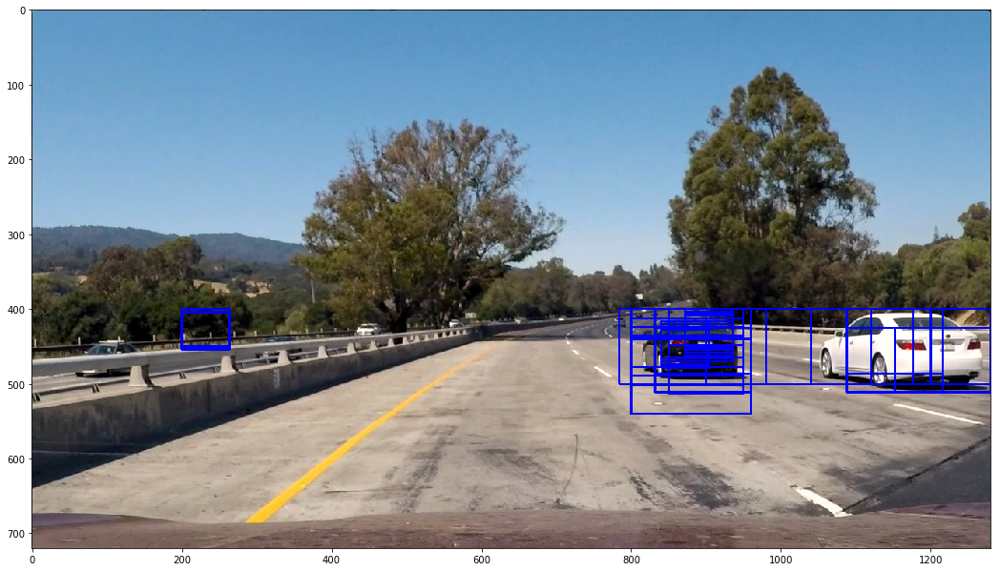

In [15]:
hw=DetectCar('test_images/test1.jpg', horizon_y=400)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


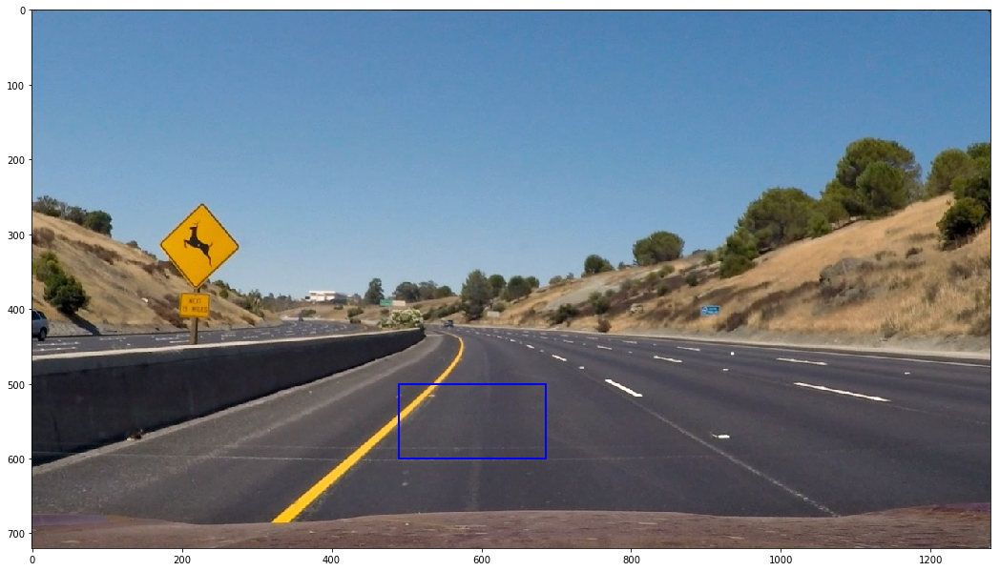

In [16]:
hw=DetectCar('test_images/test2.jpg', horizon_y=400)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


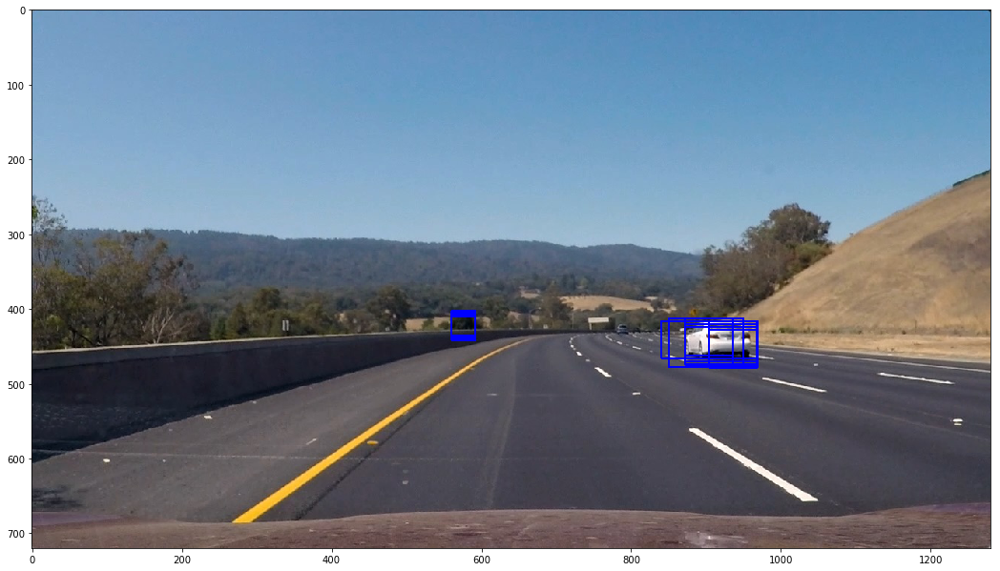

In [17]:
hw=DetectCar('test_images/test3.jpg', horizon_y=400)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


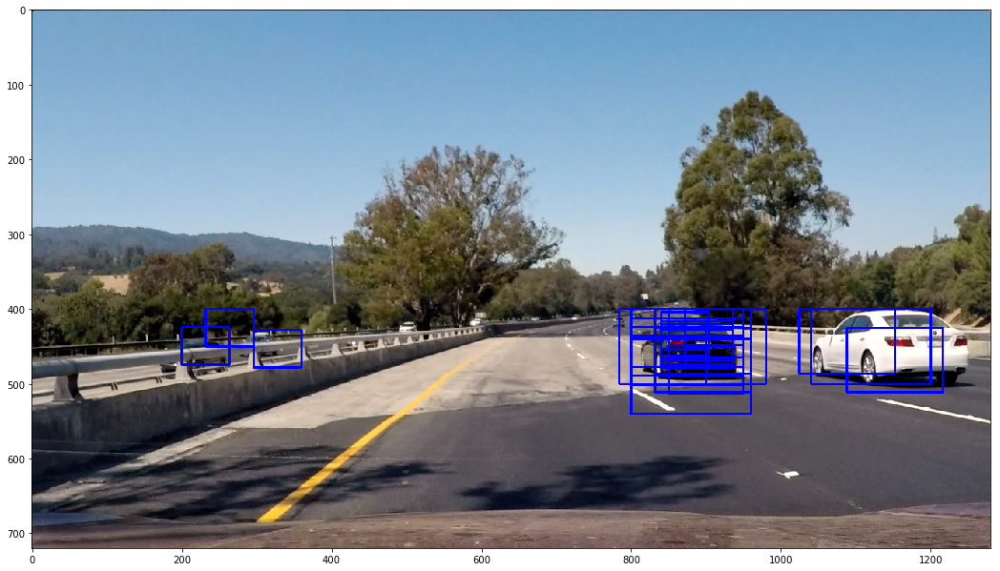

In [18]:
hw=DetectCar('test_images/test4.jpg', horizon_y=400)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


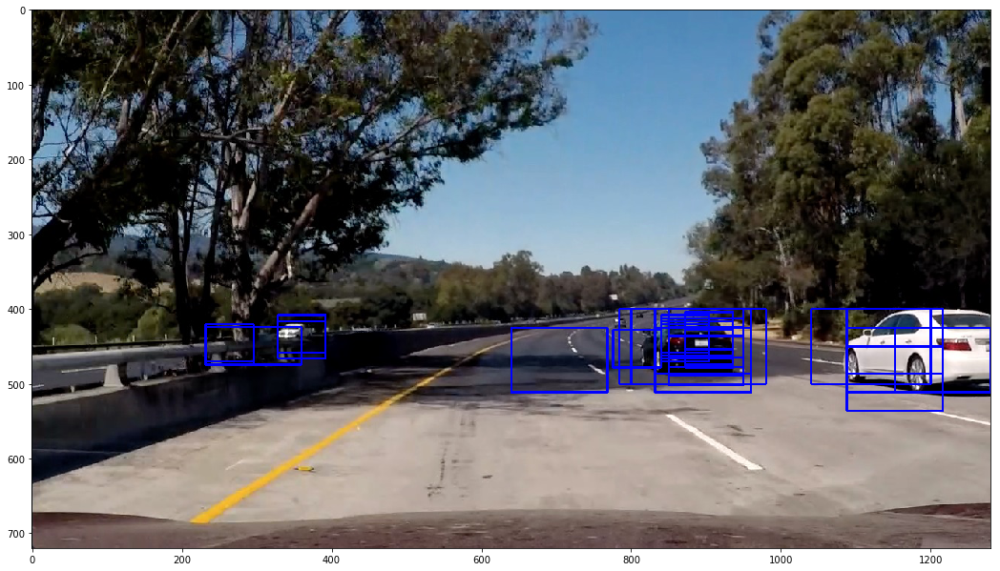

In [19]:
hw=DetectCar('test_images/test5.jpg', horizon_y=400)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


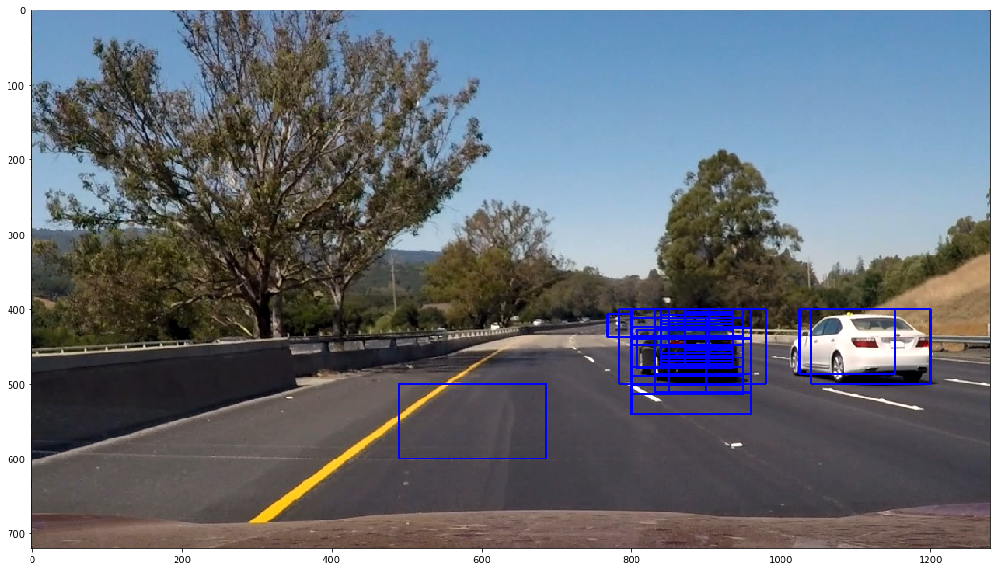

In [20]:
hw = DetectCar('test_images/test6.jpg', horizon_y=400)

In [ ]:
#TODO: 
# 1. Whole image HOG
# 2. Heat map

## Heatmap

In [21]:
from scipy.ndimage.measurements import label

In [30]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (255,0,0), 3)
    # Return the image
    return img

In [45]:
def PipeLine(image):
    horizon_y=400
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    pixel_max = np.max(image)
    if pixel_max>1.1: #jpeg format
        image = image.astype(np.float32)/255

    windows32 = slide_window(image, x_start_stop=[400, 800], y_start_stop=[horizon_y, horizon_y+40], 
                        xy_window=(32, 32), xy_overlap=(0.5, 0.9))
    windows64 = slide_window(image, x_start_stop=[200, 1000], y_start_stop=[horizon_y, horizon_y+80], 
                        xy_window=(64, 50), xy_overlap=(0.5, 0.9))
    windows96 = slide_window(image, x_start_stop=[200, 1000], y_start_stop=[horizon_y, horizon_y+120], 
                        xy_window=(100, 65), xy_overlap=(0.5, 0.8))
    windows128 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, horizon_y+140], 
                        xy_window=(128, 86), xy_overlap=(0.5, 0.7))
    windows160 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, 550], 
                        xy_window=(160, 100), xy_overlap=(0.5, 0.6))
    windows196 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, 600], 
                        xy_window=(196, 100), xy_overlap=(0.5, 0.5))
    windows256 = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, 660], 
                        xy_window=(320, 240), xy_overlap=(0.5, 0.5))

    windows = windows32+windows64+windows96+windows128+windows160+windows196+windows256

    hot_windows, off_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       
    
    #draw_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=2)  
    
    # Add heat to each box in box list
    heat = add_heat(heat, hot_windows)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    result_img = draw_labeled_bboxes(draw_image, labels)
    
    return result_img

test_images/test3.jpg


/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


test_images/test1.jpg
test_images/test5.jpg
test_images/test4.jpg
test_images/test2.jpg
test_images/test6.jpg


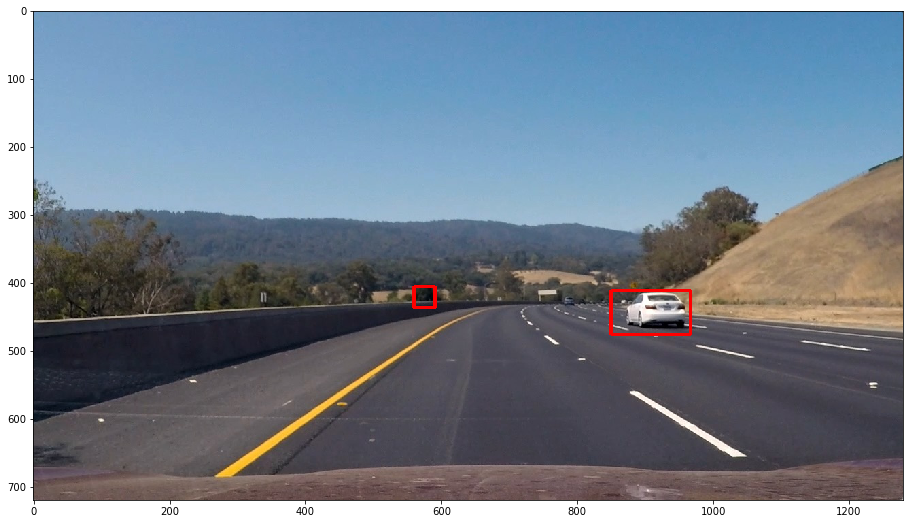

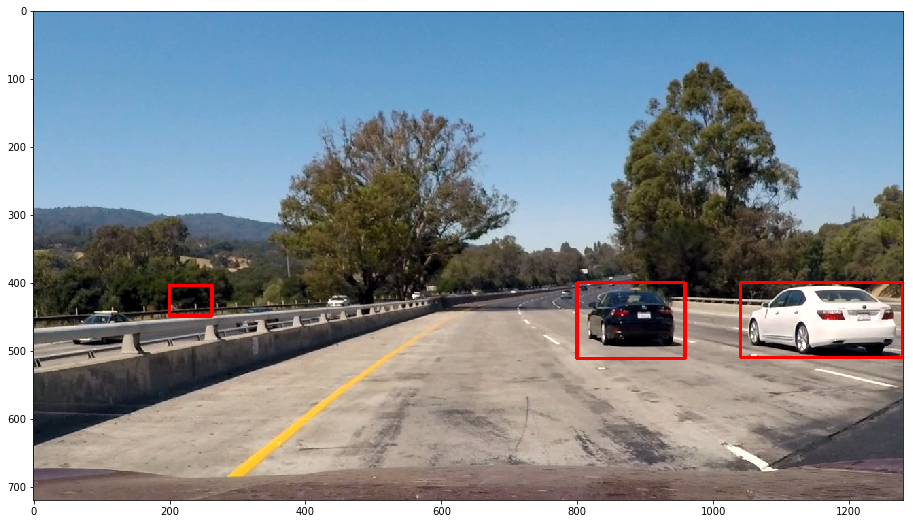

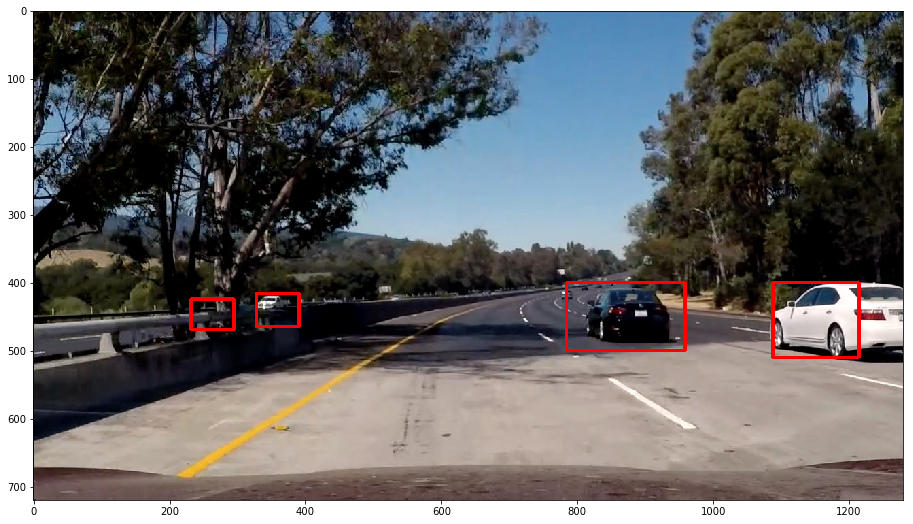

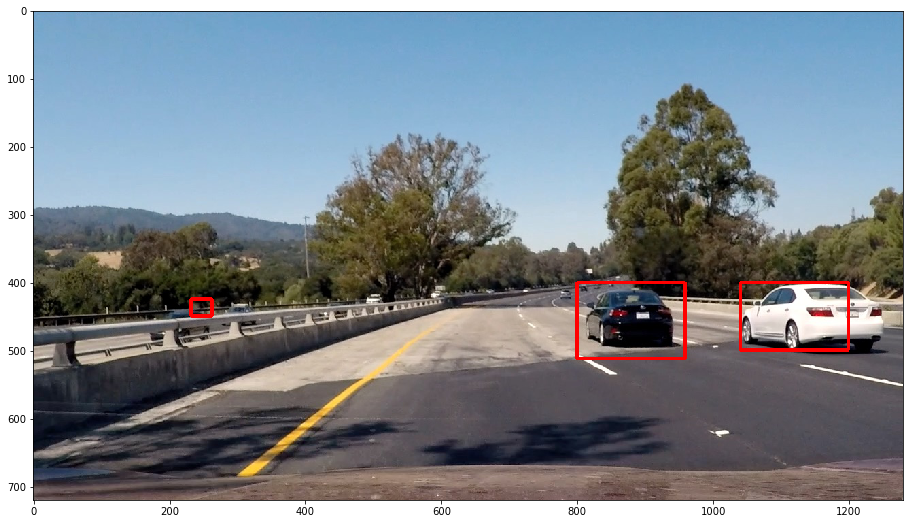

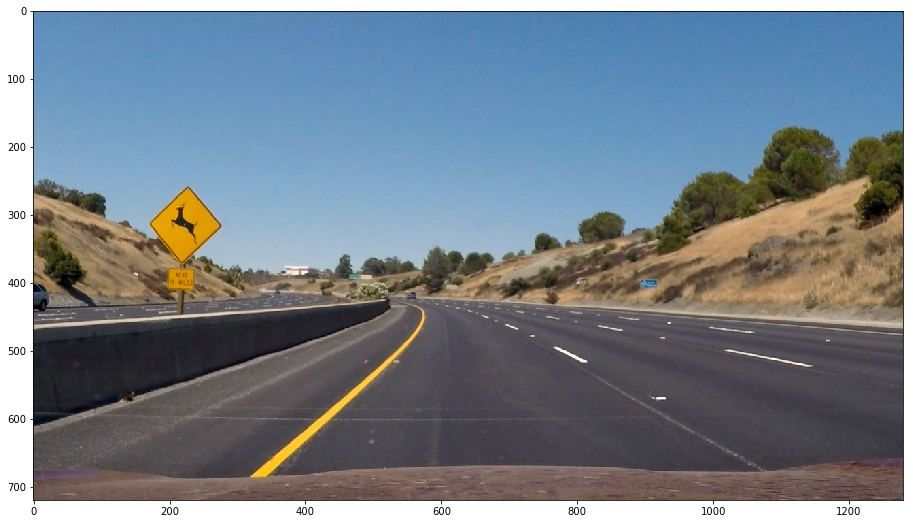

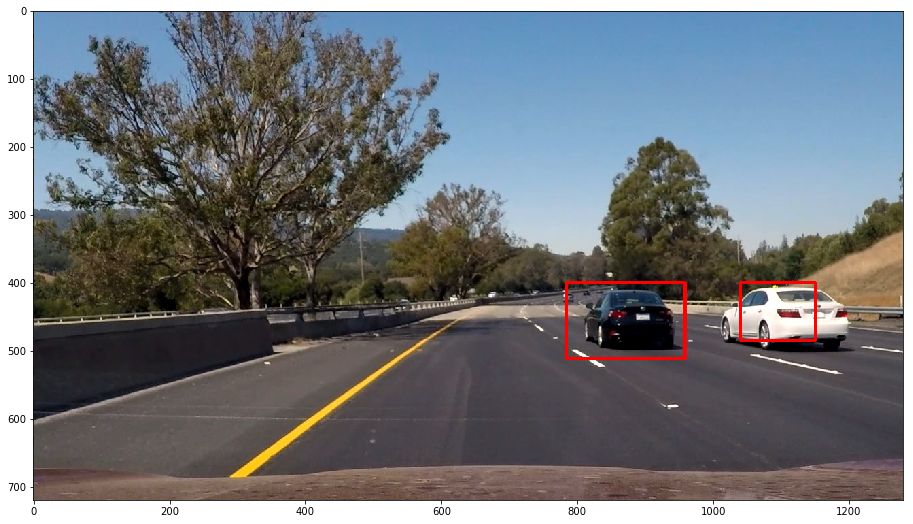

In [46]:
images_files = glob.glob('test_images/*.jpg')
for fn in images_files:
    print(fn)
    image = mpimg.imread(fn)
    result = PipeLine(image)
    fig = plt.figure(figsize=(18,9))
    plt.imshow(result)

# Processing Video

In [47]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)286720/45929032 bytes (0.6%)843776/45929032 bytes (1.8%)1351680/45929032 bytes (2.9%)1744896/45929032 bytes (3.8%)2187264/45929032 bytes (4.8%)2564096/45929032 bytes (5.6%)3104768/45929032 bytes (6.8%)3710976/45929032 bytes (8.1%)4734976/45929032 bytes (10.3%)5726208/45929032 bytes (12.5%)6561792/45929032 bytes (14.3%)7413760/45929032 bytes (16.1%)7839744/45929032 bytes (17.1%)

In [48]:
clip_output = 'test_video_output.mp4'
clip1 = VideoFileClip("test_video.mp4")
cnt=0
processor = clip1.fl_image(PipeLine) #NOTE: this function expects color images!!
%time processor.write_videofile(clip_output, audio=False)

[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


 97%|█████████▋| 38/39 [00:47<00:01,  1.26s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

CPU times: user 47.8 s, sys: 52 ms, total: 47.8 s
Wall time: 48.3 s


In [49]:
clip_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
cnt=0
processor = clip1.fl_image(PipeLine) #NOTE: this function expects color images!!
%time processor.write_videofile(clip_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [26:50<00:01,  1.27s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 26min 48s, sys: 1.47 s, total: 26min 49s
Wall time: 26min 50s
